In [73]:
import pandas as pd 
import matplotlib.pyplot as plt
import datetime
import numpy as np 
from PM_strategy import CRP,BHP
FILES_PATH = ['Model/Model_CNN_2019-03-15_2019-04-15_nbep_200/Resultats/perf.csv','Model/Model_CNN_2019-04-15_2019-05-15_nbep_200/Resultats/perf.csv',
'Model/Model_CNN_2018-11-01_2018-12-01_nbep_200/Resultats/perf.csv','Model/Model_CNN_2020-02-15_2020-03-15_nbep_200/Resultats/perf.csv',
'Model/Model_CNN_2018-09-01_2018-10-01_nbep_200/Resultats/perf.csv','Model/Model_CNN_2019-01-01_2019-02-01_nbep_200/Resultats/perf.csv']
PORT_PATH = ['Model/Model_CNN_2019-03-15_2019-04-15_nbep_200/Resultats/Portfolio_train_2019-03-15_2019-04-15_ETHBTC-XRPBTC-EOSBTC-ZECBTC-ETCBTC-XMRBTC_1.903523978754804.pickle',
'Model/Model_CNN_2019-04-15_2019-05-15_nbep_200/Resultats/Portfolio_train_2019-04-15_2019-05-15_ETHBTC-XRPBTC-EOSBTC-ZECBTC-ETCBTC-XMRBTC_1.076783963177859.pickle','Model/Model_CNN_2018-11-01_2018-12-01_nbep_200/Resultats/Portfolio_train_2018-11-01_2018-12-01_ETHBTC-XRPBTC-EOSBTC-ZECBTC-ETCBTC-XMRBTC_1.4667065199373517.pickle','Model/Model_CNN_2020-02-15_2020-03-15_nbep_200/Resultats/Portfolio_train_2020-02-15_2020-03-15_ETHBTC-XRPBTC-EOSBTC-ZECBTC-ETCBTC-XMRBTC_0.9517284192809553.pickle','Model/Model_CNN_2018-09-01_2018-10-01_nbep_200/Resultats/Portfolio_train_2018-09-01_2018-10-01_ETHBTC-XRPBTC-EOSBTC-ZECBTC-ETCBTC-XMRBTC_7.370954669373888.pickle','Model/Model_CNN_2019-01-01_2019-02-01_nbep_200/Resultats/Portfolio_train_2019-01-01_2019-02-01_ETHBTC-XRPBTC-EOSBTC-ZECBTC-ETCBTC-XMRBTC_1.0643204507589012.pickle']

In [75]:
up1,up2 = pd.read_csv(FILES_PATH[0]),pd.read_csv(FILES_PATH[1])
down1,down2 = pd.read_csv(FILES_PATH[2]),pd.read_csv(FILES_PATH[3])
eq1,eq2 =pd.read_csv(FILES_PATH[4]),pd.read_csv(FILES_PATH[5])
port_up1,port_up2 = pd.read_pickle(PORT_PATH[0]),pd.read_pickle(PORT_PATH[1])
port_down1,port_down2 = pd.read_pickle(PORT_PATH[2]),pd.read_pickle(PORT_PATH[3])
port_eq1,port_eq2 = pd.read_pickle(PORT_PATH[4]),pd.read_pickle(PORT_PATH[5])

# Ascending trend

Text(0.5, 1.0, 'Maximum drawdown in terms of episode for ascending trend')

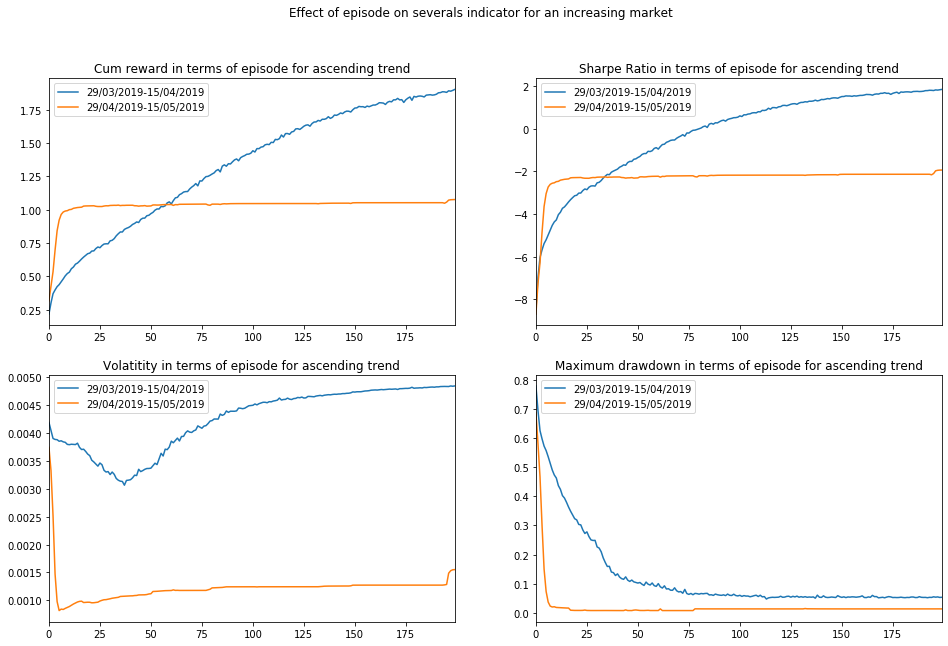

In [45]:
f = plt.figure(figsize=(16,10))
plt.suptitle('Effect of episode on severals indicator for an increasing market')
plt.subplot(221)
up1.cum_return.plot(kind='line')
up2.cum_return.plot(kind='line')
plt.legend(['29/03/2019-15/04/2019','29/04/2019-15/05/2019'],loc='upper left')
plt.title('Cum reward in terms of episode for ascending trend')
plt.subplot(222)
up1.SR_BTC.plot(kind='line')
up2.SR_BTC.plot(kind='line')
plt.legend(['29/03/2019-15/04/2019','29/04/2019-15/05/2019'],loc='upper left')
plt.title('Sharpe Ratio in terms of episode for ascending trend')
plt.subplot(223)
up1.Vol.plot(kind='line')
up2.Vol.plot(kind='line')
plt.legend(['29/03/2019-15/04/2019','29/04/2019-15/05/2019'],loc='upper left')
plt.title('Volatitity in terms of episode for ascending trend')
plt.subplot(224)
up1.MD.plot(kind='line')
up2.MD.plot(kind='line')
plt.legend(['29/03/2019-15/04/2019','29/04/2019-15/05/2019'],loc='upper left')
plt.title('Maximum drawdown in terms of episode for ascending trend')



In [44]:
weight_up1 = pd.DataFrame(port_up1.weights,columns=['BTCUSD']+port_up1.symbols)
weight_up1['time'] = pd.date_range(start = datetime.datetime(2019,3,29,0,0),end=datetime.datetime(2019,4,15,0,0)-datetime.timedelta(minutes=30),freq='30min')
weight_up2 = pd.DataFrame(port_up2.weights,columns=['BTCUSD']+port_up1.symbols)
weight_up2['time'] = pd.date_range(start = datetime.datetime(2019,4,29,0,0),end=datetime.datetime(2019,5,15,0,0)-datetime.timedelta(minutes=30),freq='30min')

Text(0.5, 1.0, 'Weight allocation through time (29/03/2019-15/04/2019)')

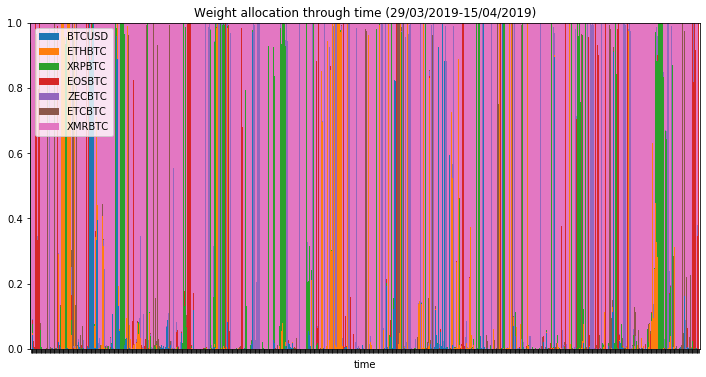

In [80]:
t= weight_up1.set_index('time')
t.plot(kind='bar',stacked=True,width=1.0,figsize=(12,6)).set_xticklabels([])
plt.legend(loc='upper left')
plt.title('Weight allocation through time (29/03/2019-15/04/2019)')


Text(0.5, 1.0, 'Weight allocation through time (29/04/2019-15/05/2019)')

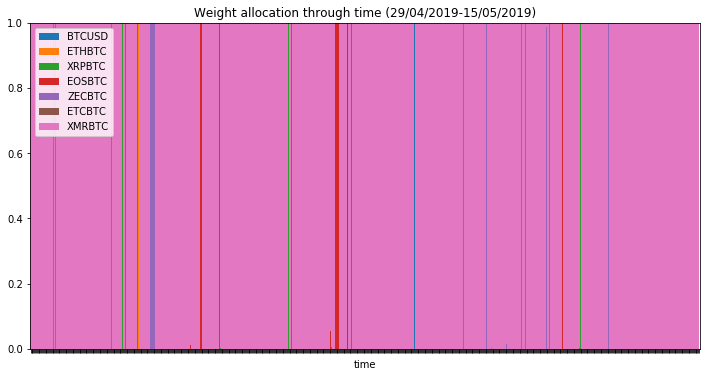

In [81]:
t=weight_up2.set_index('time')
t.plot(kind='bar',stacked=True,width=1.0,figsize=(12,6)).set_xticklabels([])
plt.legend(loc='upper left')
plt.title('Weight allocation through time (29/04/2019-15/05/2019)')

Text(0.5, 1.0, 'Cumlative return for the portfolio and assets')

<Figure size 864x432 with 0 Axes>

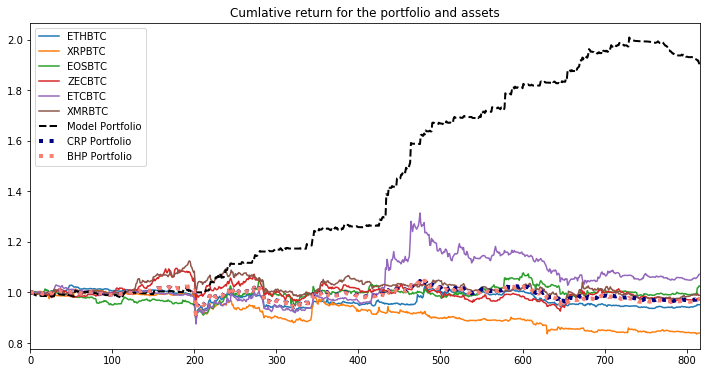

In [59]:
y = CRP(port_up1.df_normalized[(port_up1.df_normalized.index >= datetime.datetime(2019,3,29)) &(port_up1.df_normalized.index <= datetime.datetime(2019,4,15)) ],datetime.datetime(2019,3,29),datetime.datetime(2019,4,15))
CRP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

y = BHP(port_up1.df_normalized[(port_up1.df_normalized.index >= datetime.datetime(2019,3,29)) &(port_up1.df_normalized.index <= datetime.datetime(2019,4,15)) ],datetime.datetime(2019,3,29),datetime.datetime(2019,4,15))
BHP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

plt.figure(figsize=(12,6))
np.cumprod(port_up1.df_normalized[port_up1.idx_depart:]).reset_index().drop('index',axis=1).plot(kind='line',figsize=(12,6))
(pd.DataFrame(np.cumprod(port_up1.returns),columns=["returns"])).returns.plot(kind="line",figsize=(12,6),color = 'black',linewidth=2,linestyle='dashed')
CRP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'navy',linewidth=4,linestyle='dotted')
BHP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'salmon',linewidth=4,linestyle='dotted')
plt.legend(port_up1.symbols + ['Model Portfolio','CRP Portfolio','BHP Portfolio'],loc='bottom left')
plt.title('Cumlative return for the portfolio and assets')

Text(0.5, 1.0, 'Cumlative return for the portfolio and assets')

<Figure size 864x432 with 0 Axes>

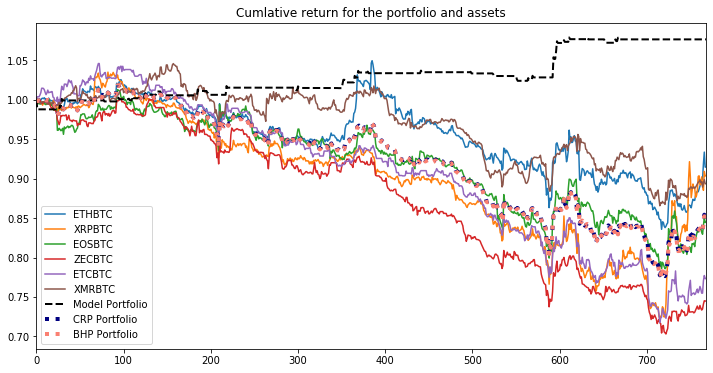

In [56]:
y = CRP(port_up2.df_normalized[(port_up2.df_normalized.index >= datetime.datetime(2019,4,29)) &(port_up2.df_normalized.index <= datetime.datetime(2019,5,15)) ],datetime.datetime(2019,4,29),datetime.datetime(2019,5,15))
CRP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

y = BHP(port_up2.df_normalized[(port_up2.df_normalized.index >= datetime.datetime(2019,4,29)) &(port_up2.df_normalized.index <= datetime.datetime(2019,5,15)) ],datetime.datetime(2019,4,29),datetime.datetime(2019,5,15))
BHP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

plt.figure(figsize=(12,6))
np.cumprod(port_up2.df_normalized[port_up2.idx_depart:]).reset_index().drop('index',axis=1).plot(kind='line',figsize=(12,6))
(pd.DataFrame(np.cumprod(port_up2.returns),columns=["returns"])).returns.plot(kind="line",figsize=(12,6),color = 'black',linewidth=2,linestyle='dashed')
CRP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'navy',linewidth=4,linestyle='dotted')
BHP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'salmon',linewidth=4,linestyle='dotted')
plt.legend(port_up2.symbols + ['Model Portfolio','CRP Portfolio','BHP Portfolio'],loc='bottom left')
plt.title('Cumlative return for the portfolio and assets')

# Decreasing

Text(0.5, 1.0, 'Maximum drawdown in terms of episode for decreasing trend')

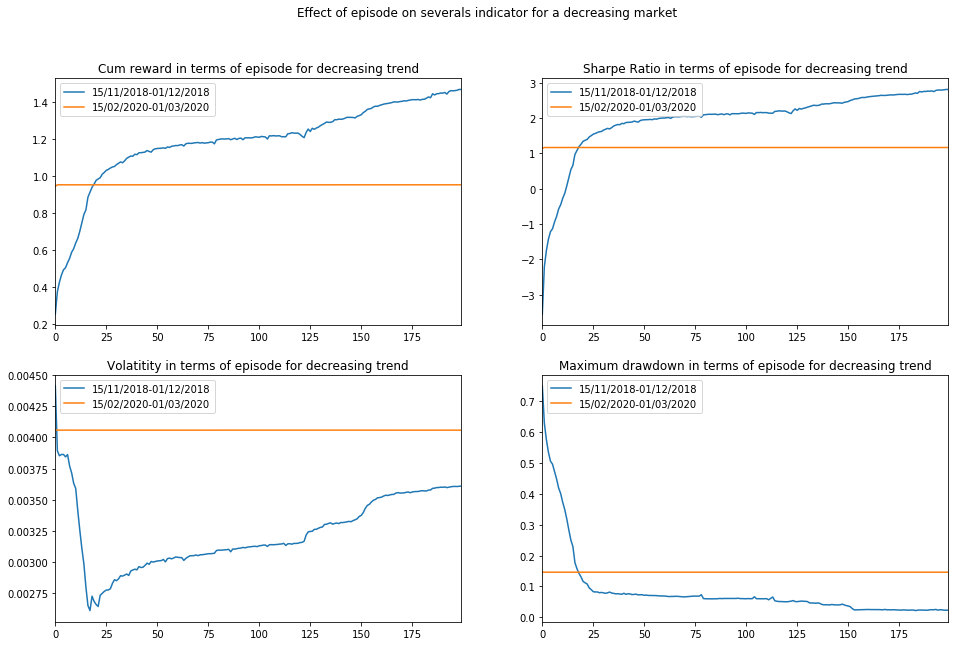

In [76]:
f = plt.figure(figsize=(16,10))
plt.suptitle('Effect of episode on severals indicator for a decreasing market')
plt.subplot(221)
down1.cum_return.plot(kind='line')
down2.cum_return.plot(kind='line')
plt.legend(['15/11/2018-01/12/2018','15/02/2020-01/03/2020'],loc='upper left')
plt.title('Cum reward in terms of episode for decreasing trend')
plt.subplot(222)
down1.SR_BTC.plot(kind='line')
down2.SR_BTC.plot(kind='line')
plt.legend(['15/11/2018-01/12/2018','15/02/2020-01/03/2020'],loc='upper left')
plt.title('Sharpe Ratio in terms of episode for decreasing trend')
plt.subplot(223)
down1.Vol.plot(kind='line')
down2.Vol.plot(kind='line')
plt.legend(['15/11/2018-01/12/2018','15/02/2020-01/03/2020'],loc='upper left')
plt.title('Volatitity in terms of episode for decreasing trend')
plt.subplot(224)
down1.MD.plot(kind='line')
down2.MD.plot(kind='line')
plt.legend(['15/11/2018-01/12/2018','15/02/2020-01/03/2020'],loc='upper left')
plt.title('Maximum drawdown in terms of episode for decreasing trend')



In [79]:
weight_down1 = pd.DataFrame(port_down1.weights,columns=['BTCUSD']+port_down1.symbols)
weight_down1['time'] = pd.date_range(start = datetime.datetime(2018,11,15,0,0),end=datetime.datetime(2018,12,1,0,0)-datetime.timedelta(minutes=30),freq='30min')
weight_down2 = pd.DataFrame(port_down2.weights,columns=['BTCUSD']+port_down1.symbols)
weight_down2['time'] = pd.date_range(start = datetime.datetime(2020,2,29,0,0),end=datetime.datetime(2020,3,15,0,0)-datetime.timedelta(minutes=30),freq='30min')

Text(0.5, 1.0, 'Weight allocation through time (15/11/2018-01/12/2018)')

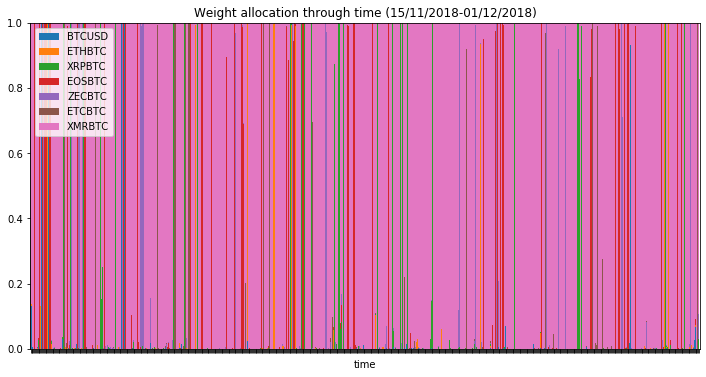

In [5]:
t= weight_down1.set_index('time')
t.plot(kind='bar',stacked=True,width=1.0,figsize=(12,6)).set_xticklabels([])
plt.legend(loc='upper left')
plt.title('Weight allocation through time (15/11/2018-01/12/2018)')

Text(0.5, 1.0, 'Weight allocation through time (15/02/2020-01/03/2020)')

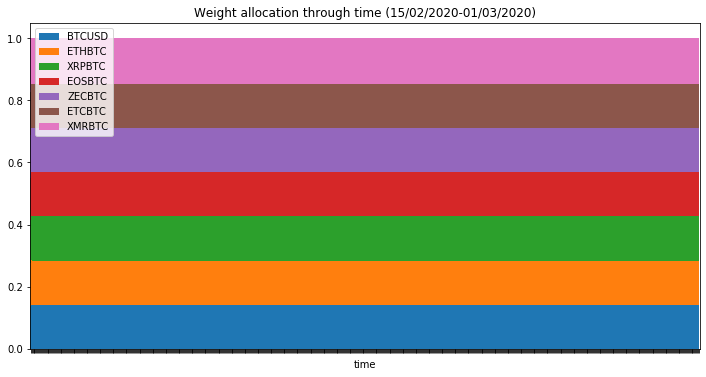

In [80]:
t=weight_down2.set_index('time')
t.plot(kind='bar',stacked=True,width=1.0,figsize=(12,6)).set_xticklabels([])
plt.legend(loc='upper left')
plt.title('Weight allocation through time (15/02/2020-01/03/2020)')

Text(0.5, 1.0, 'Cumlative return for the portfolio and assets')

<Figure size 864x432 with 0 Axes>

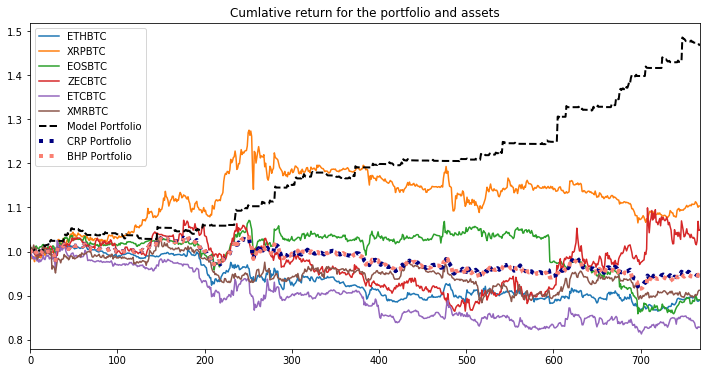

In [61]:
y = CRP(port_down1.df_normalized[(port_down1.df_normalized.index >= datetime.datetime(2018,11,15)) &(port_down1.df_normalized.index <= datetime.datetime(2018,12,1)) ],datetime.datetime(2018,11,15),datetime.datetime(2018,12,1))
CRP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

y = BHP(port_down1.df_normalized[(port_down1.df_normalized.index >= datetime.datetime(2018,11,15)) &(port_down1.df_normalized.index <= datetime.datetime(2018,12,1)) ],datetime.datetime(2018,11,15),datetime.datetime(2018,12,1))
BHP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

plt.figure(figsize=(12,6))
np.cumprod(port_down1.df_normalized[port_down1.idx_depart:]).reset_index().drop('index',axis=1).plot(kind='line',figsize=(12,6))
(pd.DataFrame(np.cumprod(port_down1.returns),columns=["returns"])).returns.plot(kind="line",figsize=(12,6),color = 'black',linewidth=2,linestyle='dashed')
CRP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'navy',linewidth=4,linestyle='dotted')
BHP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'salmon',linewidth=4,linestyle='dotted')
plt.legend(port_down1.symbols + ['Model Portfolio','CRP Portfolio','BHP Portfolio'],loc='bottom left')
plt.title('Cumlative return for the portfolio and assets')

Text(0.5, 1.0, 'Cumlative return for the portfolio and assets')

<Figure size 864x432 with 0 Axes>

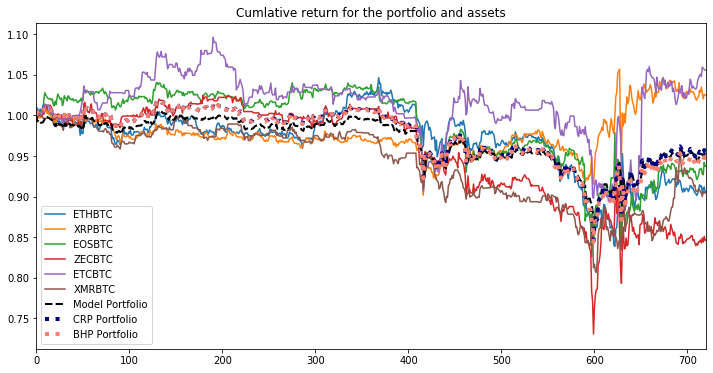

In [78]:
y = CRP(port_down2.df_normalized[(port_down2.df_normalized.index >= datetime.datetime(2020,2,29)) &(port_down2.df_normalized.index <= datetime.datetime(2020,3,15)) ],datetime.datetime(2020,2,29),datetime.datetime(2020,3,15))
CRP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

y = BHP(port_down2.df_normalized[(port_down2.df_normalized.index >= datetime.datetime(2020,2,29)) &(port_down2.df_normalized.index <= datetime.datetime(2020,3,15)) ],datetime.datetime(2020,2,29),datetime.datetime(2020,3,15))
BHP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

plt.figure(figsize=(12,6))
np.cumprod(port_down2.df_normalized[port_down2.idx_depart:]).reset_index().drop('index',axis=1).plot(kind='line',figsize=(12,6))
(pd.DataFrame(np.cumprod(port_down2.returns),columns=["returns"])).returns.plot(kind="line",figsize=(12,6),color = 'black',linewidth=2,linestyle='dashed')
CRP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'navy',linewidth=4,linestyle='dotted')
BHP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'salmon',linewidth=4,linestyle='dotted')
plt.legend(port_down2.symbols + ['Model Portfolio','CRP Portfolio','BHP Portfolio'],loc='bottom left')
plt.title('Cumlative return for the portfolio and assets')

# Same level market

Text(0.5, 1.0, 'Maximum draw in terms of episode for equal trend')

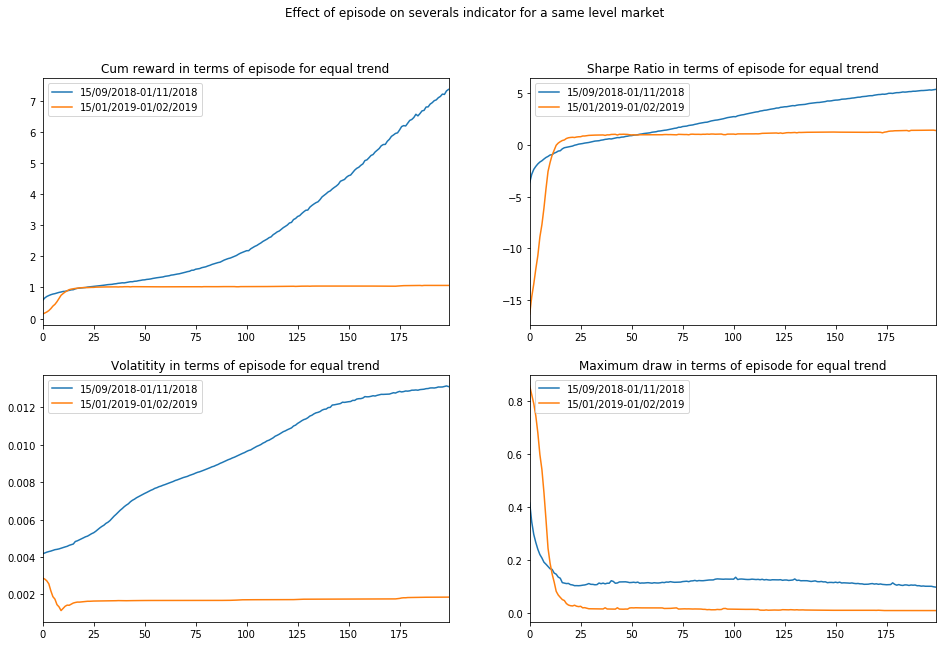

In [12]:
f = plt.figure(figsize=(16,10))
plt.suptitle('Effect of episode on severals indicator for a same level market')
plt.subplot(221)
eq1.cum_return.plot(kind='line')
eq2.cum_return.plot(kind='line')
plt.legend(['15/09/2018-01/11/2018','15/01/2019-01/02/2019'],loc='upper left')
plt.title('Cum reward in terms of episode for equal trend')
plt.subplot(222)
eq1.SR_BTC.plot(kind='line')
eq2.SR_BTC.plot(kind='line')
plt.legend(['15/09/2018-01/11/2018','15/01/2019-01/02/2019'],loc='upper left')
plt.title('Sharpe Ratio in terms of episode for equal trend')
plt.subplot(223)
eq1.Vol.plot(kind='line')
eq2.Vol.plot(kind='line')
plt.legend(['15/09/2018-01/11/2018','15/01/2019-01/02/2019'],loc='upper left')
plt.title('Volatitity in terms of episode for equal trend')
plt.subplot(224)
eq1.MD.plot(kind='line')
eq2.MD.plot(kind='line')
plt.legend(['15/09/2018-01/11/2018','15/01/2019-01/02/2019'],loc='upper left')
plt.title('Maximum draw in terms of episode for equal trend')



In [13]:
weight_eq1 = pd.DataFrame(port_eq1.weights,columns=['BTCUSD']+port_eq1.symbols)
weight_eq1['time'] = pd.date_range(start = datetime.datetime(2018,9,15,0,0),end=datetime.datetime(2018,10,1,0,0)-datetime.timedelta(minutes=30),freq='30min')
weight_eq2 = pd.DataFrame(port_eq2.weights,columns=['BTCUSD']+port_eq1.symbols)
weight_eq2['time'] = pd.date_range(start = datetime.datetime(2019,1,15,0,0),end=datetime.datetime(2019,2,1,0,0)-datetime.timedelta(minutes=30),freq='30min')

Text(0.5, 1.0, 'Weight allocation through time (15/09/2018-01/11/2018)')

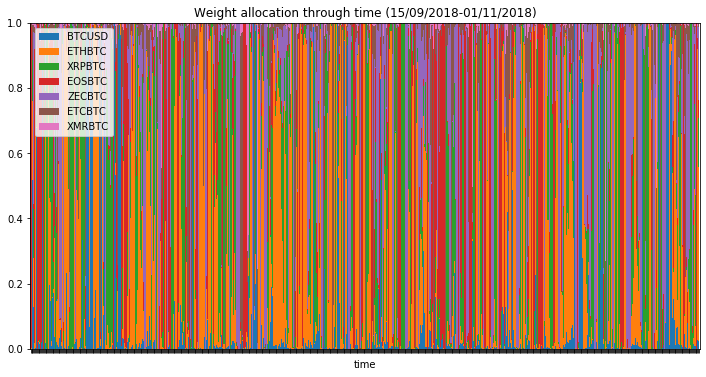

In [14]:
t= weight_eq1.set_index('time')
t.plot(kind='bar',stacked=True,width=1.0,figsize=(12,6)).set_xticklabels([])
plt.legend(loc='upper left')
plt.title('Weight allocation through time (15/09/2018-01/11/2018)')


Text(0.5, 1.0, 'Weight allocation through time (15/01/2019-01/02/2019)')

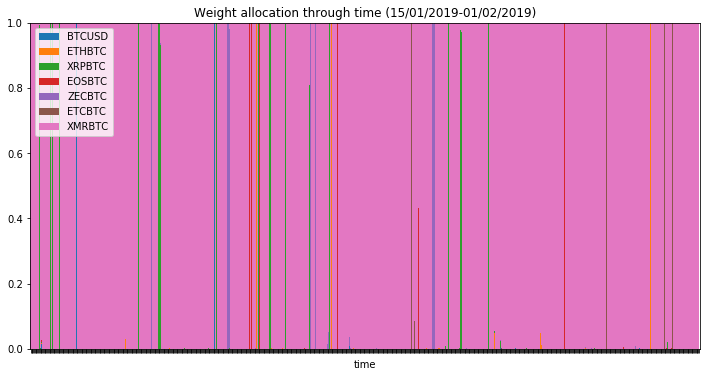

In [15]:
t=weight_eq2.set_index('time')
t.plot(kind='bar',stacked=True,width=1.0,figsize=(12,6)).set_xticklabels([])
plt.legend(loc='upper left')
plt.title('Weight allocation through time (15/01/2019-01/02/2019)')

Text(0.5, 1.0, 'Cumlative return for the portfolio and assets')

<Figure size 864x432 with 0 Axes>

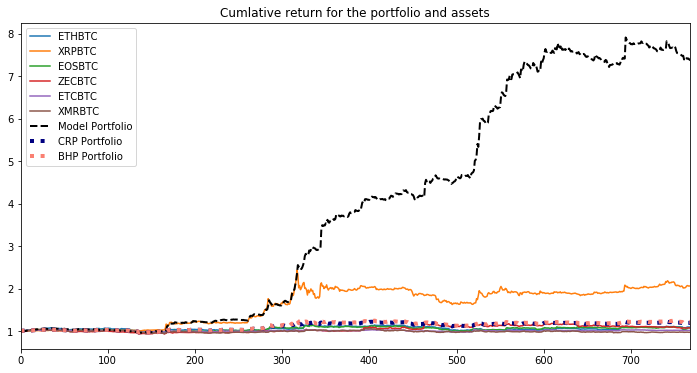

In [64]:
y = CRP(port_eq1.df_normalized[(port_eq1.df_normalized.index >= datetime.datetime(2018,9,15)) &(port_eq1.df_normalized.index <= datetime.datetime(2018,10,1)) ],datetime.datetime(2018,9,15),datetime.datetime(2018,10,1))
CRP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

y = BHP(port_eq1.df_normalized[(port_eq1.df_normalized.index >= datetime.datetime(2018,9,15)) &(port_eq1.df_normalized.index <= datetime.datetime(2018,10,1)) ],datetime.datetime(2018,9,15),datetime.datetime(2018,10,1))
BHP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

plt.figure(figsize=(12,6))
np.cumprod(port_eq1.df_normalized[port_eq1.idx_depart:]).reset_index().drop('index',axis=1).plot(kind='line',figsize=(12,6))
(pd.DataFrame(np.cumprod(port_eq1.returns),columns=["returns"])).returns.plot(kind="line",figsize=(12,6),color = 'black',linewidth=2,linestyle='dashed')
CRP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'navy',linewidth=4,linestyle='dotted')
BHP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'salmon',linewidth=4,linestyle='dotted')
plt.legend(port_eq1.symbols + ['Model Portfolio','CRP Portfolio','BHP Portfolio'],loc='bottom left')
plt.title('Cumlative return for the portfolio and assets')

Text(0.5, 1.0, 'Cumlative return for the portfolio and assets')

<Figure size 864x432 with 0 Axes>

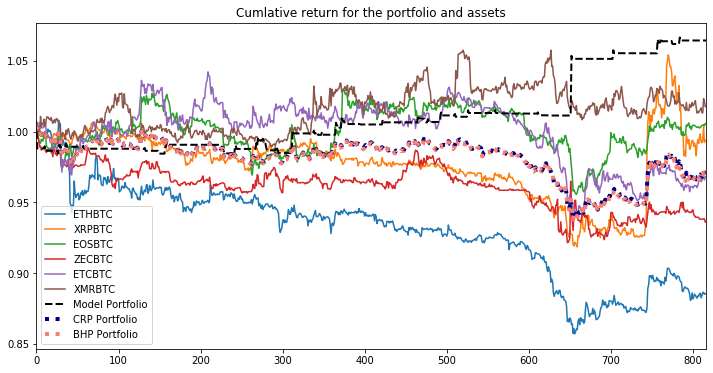

In [65]:
y = CRP(port_eq2.df_normalized[(port_eq2.df_normalized.index >= datetime.datetime(2019,1,15)) &(port_eq2.df_normalized.index <= datetime.datetime(2019,2,1)) ],datetime.datetime(2019,1,15),datetime.datetime(2019,2,1))
CRP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

y = BHP(port_eq2.df_normalized[(port_eq2.df_normalized.index >= datetime.datetime(2019,1,15)) &(port_eq2.df_normalized.index <= datetime.datetime(2019,2,1)) ],datetime.datetime(2019,1,15),datetime.datetime(2019,2,1))
BHP_cum_return = pd.DataFrame(np.cumprod(y),columns=['returns'])

plt.figure(figsize=(12,6))
np.cumprod(port_eq2.df_normalized[port_eq2.idx_depart:]).reset_index().drop('index',axis=1).plot(kind='line',figsize=(12,6))
(pd.DataFrame(np.cumprod(port_eq2.returns),columns=["returns"])).returns.plot(kind="line",figsize=(12,6),color = 'black',linewidth=2,linestyle='dashed')
CRP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'navy',linewidth=4,linestyle='dotted')
BHP_cum_return.returns.plot(kind='line',figsize=(12,6),color = 'salmon',linewidth=4,linestyle='dotted')
plt.legend(port_eq2.symbols + ['Model Portfolio','CRP Portfolio','BHP Portfolio'],loc='bottom left')
plt.title('Cumlative return for the portfolio and assets')